# Reproducing Villena-Gonzalez CDA Study (2019) - Cleaning

## Notes
- Cleaning c'est subjectif. J'veux montrer une "trends". J'fais pas une thèse sur le cleaning... J'veux juste montrer entre raw est cleaned, on a un clearer CDA...
- Cleaning with AutoCorrect, déjà c'est mieux!

In [1]:
import numpy as np
import glob
import pickle

import mne
from mne import Epochs, pick_channels, find_events, concatenate_epochs
from mne.io import read_raw_bdf

import sys
sys.path.append('/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/')
from events import get_specific_events, get_epochs, get_CDA, prep_report, fill_report, get_report, checksum
 
from autoreject import AutoReject

import matplotlib.pyplot as plt
%matplotlib inline

## 1. Prep Data

In [2]:
#==================================================================
# General Variables
#==================================================================
## Organize Triggers
triggers = dict();

# --------------------------
triggers['1'] = [10,11,12,13] 
triggers['2'] = [20,21,22,23]
triggers['4'] = [40,41,42,43]

triggers['left'] = [11,12,21,22,41,42]
triggers['right'] = [10,13,20,23,40,43]

triggers['good'] = [60]
triggers['bad'] = [61]

# Labels
conds = ['1', '2', '4']
sides = ['left', 'right']
perfs = ['good', 'bad']

# CDA Channels
chan_right = ['TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2']
chan_left =  ['TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1']

# Epoch information
epoch_length = 1.2
epoch_tmin = -0.4
baseline_corr = (-0.4, -0.2)

# CDA main variable!
cda_dict = dict()
cda_dict_clean = dict()
report = prep_report(conds, sides, perfs)

#==================================================================
# Main Loop - Loading All Files & Extract CDAs.
#==================================================================
#directory_path = 'D:\\CLNT\\Data\\Open Datasets\\Villena-Gonzalez 2019\\Data\\'
directory_path = '/Users/nick/Documents/PhD/CDA Datasets/Villena-Gonzalez 2019/Data/'
sep = '/'

#filepath = directory_path + 'CS230419.bdf'

for filepath in glob.iglob(directory_path + '*.bdf'):
    filename = filepath[filepath.rfind(sep)+1:]
    print('Processing: ' + filename + '...')

    # ------------------------
    # 1. -- Load File --
    # ------------------------
    raw = read_raw_bdf(filepath, preload=True)

    # ------------------------
    # 2. -- Preprocessing --
    # ------------------------
    # Keep only EEG channels and reference
    #raw = raw.rename_channels({'EXG7':'A1', 'EXG8': 'A2'})
    raw = raw.drop_channels(ch_names=['EXG7','EXG8','EXG3','EXG4','EXG5','EXG6'])
    raw = raw.set_eeg_reference(ref_channels=['EXG1', 'EXG2'])
    raw = raw.set_channel_types({'EXG1': 'misc', 'EXG2': 'misc'})

    # Set Electrodes Locations
    montage = mne.channels.make_standard_montage('biosemi64')
    raw.set_montage(montage)

    # Resample
    preproc = raw.resample(1024)

    # Filter
    preproc = preproc.filter(.1, 20., fir_design='firwin', skip_by_annotation='edge')

    # Events
    events = find_events(preproc)

    # Plot (visual check)
    #preproc.plot(events=events, block=True, lowpass=40)

    # ------------------------
    # 3. -- Epochs --
    # ------------------------
    specific_events = get_specific_events(events, conds, sides, perfs, triggers)

    epochs_dict = get_epochs(preproc, specific_events, epoch_length, epoch_tmin, baseline_corr)

    # ------------------------
    # X. -- CLEANING! --
    # ------------------------
    ar = AutoReject()

    # Flatten epochs to clean all at once.
    epochs_dict_clean = dict()
    epochs_to_clean = []
    for c in epochs_dict.keys():
        epochs_dict_clean[c] = dict()
        for s in epochs_dict[c].keys():
            epochs_dict_clean[c][s] = dict()
            for p in ['good']:#epochs_dict[c][s].keys():
                epochs_dict_clean[c][s][p] = []
                epochs_to_clean.append(epochs_dict[c][s][p])

    len(epochs_to_clean)

    cleaned_epochs = ar.fit_transform(mne.concatenate_epochs(epochs_to_clean)) 

    # Reconstruct epochs                
    for cond in conds:
        for t in triggers[cond]:
            for side in sides:
                if t in triggers[side]:
                    cur_side = side

            epochs_dict_clean[cond][cur_side]['good'].append(cleaned_epochs[str(t)])

    # Concatenate Epochs into Epochs MNE structure (from a list of Epochs because of diff triggers)
    for cond in conds:
        for side in sides:
            epochs_dict_clean[cond][side]['good'] = mne.concatenate_epochs(epochs_dict_clean[cond][side]['good'])
            
    # ------------------------
    # 4. - Report & Checksum -
    # ------------------------
    report = fill_report(report, filename, specific_events)
    report.at[filename, 'checksum'] = checksum(specific_events, epochs_dict_clean)

    # ------------------------
    # 5 -- CDA --
    # ------------------------
    cda_dict[filename] = get_CDA(epochs_dict, conds, sides, perfs, chan_right, chan_left)
    cda_dict_clean[filename] = get_CDA(epochs_dict_clean, conds, sides, ['good'], chan_right, chan_left)

# Add time points to CDA for later use.
times = epochs_dict['2']['left']['good'].times

# Print report
subreport = get_report(report, ['1','2', '4'], ['left','right'], ['good', 'bad'], [])
report

Processing: LS150419.bdf...
Extracting EDF parameters from /Users/nick/Documents/PhD/CDA Datasets/Villena-Gonzalez 2019/Data/LS150419.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 790527  =      0.000 ...   386.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65577 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
380 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65577 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
380 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
-------------------







Estimated consensus=0.20 and n_interpolate=4



Dropped 28 epochs: 2, 6, 7, 8, 10, 12, 13, 16, 18, 21, 27, 28, 29, 33, 35, 36, 38, 39, 50, 51, 58, 61, 63, 64, 67, 69, 71, 79
Not setting metadata
Not setting metadata
9 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
10 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
10 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
11 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
5 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
8 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Length mismatch for: 1-left-good (16 e







Estimated consensus=0.30 and n_interpolate=4



Dropped 11 epochs: 0, 4, 16, 19, 31, 57, 58, 60, 63, 73, 77
Not setting metadata
Not setting metadata
14 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
13 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
13 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
12 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
11 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
10 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Length mismatch for: 1-left-good (16 events vs 14 epochs)
Checksum FAILED! Invalid key for: 1-left-ba







Estimated consensus=0.30 and n_interpolate=4



Dropped 37 epochs: 1, 4, 5, 6, 16, 17, 19, 20, 21, 22, 23, 24, 26, 30, 31, 32, 33, 36, 43, 46, 47, 49, 52, 53, 59, 60, 61, 62, 63, 64, 66, 71, 74, 75, 76, 80, 81
Not setting metadata
Not setting metadata
11 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
6 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
9 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
9 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
7 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
6 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Leng







Estimated consensus=0.30 and n_interpolate=4



Dropped 22 epochs: 1, 4, 6, 8, 9, 10, 11, 13, 19, 23, 28, 32, 37, 47, 48, 52, 55, 57, 66, 75, 76, 80
Not setting metadata
Not setting metadata
8 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
11 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
12 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
11 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
9 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
9 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Length mismatch for: 1-left-good (16 events vs 8 epochs)
Checks







Estimated consensus=0.80 and n_interpolate=4



Dropped 2 epochs: 50, 72
Not setting metadata
Not setting metadata
16 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
11 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
10 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Invalid key for: 1-left-bad
Checksum FAILED! Invalid key for: 1-right-bad
Checksum FAILED! Invalid key for: 2-left-bad
Checksum FAILED! 







Estimated consensus=0.60 and n_interpolate=1



Dropped 8 epochs: 19, 20, 29, 47, 57, 60, 65, 69
Not setting metadata
Not setting metadata
16 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
13 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
14 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
9 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
6 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
11 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Invalid key for: 1-left-bad
Checksum FAILED! Length mismatch for: 1-right-good (16 events vs 13 epochs)
Checksum F







Estimated consensus=0.60 and n_interpolate=32



Dropped 2 epochs: 62, 66
Not setting metadata
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
16 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
13 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
6 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
10 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Invalid key for: 1-left-bad
Checksum FAILED! Invalid key for: 1-right-bad
Checksum FAILED! Invalid key for: 2-left-bad
Checksum FAILED! I







Estimated consensus=0.70 and n_interpolate=32



Dropped 5 epochs: 20, 21, 31, 33, 55
Not setting metadata
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
13 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
13 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
14 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
9 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
7 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Invalid key for: 1-left-bad
Checksum FAILED! Length mismatch for: 1-right-good (15 events vs 13 epochs)
Checksum FAILED! Inval







Estimated consensus=0.70 and n_interpolate=32



Dropped 2 epochs: 49, 66
Not setting metadata
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
16 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
16 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
14 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
14 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Invalid key for: 1-left-bad
Checksum FAILED! Invalid key for: 1-right-bad
Checksum FAILED! Invalid key for: 2-left-bad
Checksum FAILED! 







Estimated consensus=0.60 and n_interpolate=32



Dropped 12 epochs: 0, 10, 14, 19, 32, 48, 54, 57, 66, 67, 73, 77
Not setting metadata
Not setting metadata
13 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
14 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
12 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
13 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
9 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
5 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Length mismatch for: 1-left-good (16 events vs 13 epochs)
Checksum FAILED! Invalid key for: 1-left

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_75670/2321152553.py:120: RuntimeWarning: One of the Epochs objects to concatenate was empty.
  epochs_dict_clean[cond][side]['good'] = mne.concatenate_epochs(epochs_dict_clean[cond][side]['good'])


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.0







Estimated consensus=0.60 and n_interpolate=32



Dropped 6 epochs: 4, 17, 22, 34, 41, 84
Not setting metadata
Not setting metadata
13 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
14 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
13 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
16 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
14 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
12 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Length mismatch for: 1-left-good (14 events vs 13 epochs)
Checksum FAILED! Invalid key for: 1-left-bad
Checksum FAILED! L







Estimated consensus=0.70 and n_interpolate=32



Dropped 10 epochs: 3, 7, 16, 28, 36, 47, 48, 64, 69, 71
Not setting metadata
Not setting metadata
14 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
14 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
12 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
12 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
10 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
7 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Length mismatch for: 1-left-good (16 events vs 14 epochs)
Checksum FAILED! Invalid key for: 1-left-bad
Che







Estimated consensus=0.60 and n_interpolate=32



No bad epochs were found for your data. Returning a copy of the data you wanted to clean. Interpolation may have been done.
Not setting metadata
Not setting metadata
16 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
16 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
12 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
12 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Invalid key for: 1-left-bad
Checksum 







Estimated consensus=0.60 and n_interpolate=32



Dropped 7 epochs: 0, 4, 5, 10, 11, 24, 31
Not setting metadata
Not setting metadata
6 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
12 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
9 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
16 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
10 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
13 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Length mismatch for: 1-left-good (9 events vs 6 epochs)
Checksum FAILED! Invalid key for: 1-left-bad
Checksum FAILED! Len







Estimated consensus=0.50 and n_interpolate=4



Dropped 13 epochs: 7, 12, 14, 16, 17, 30, 32, 39, 48, 56, 58, 67, 78
Not setting metadata
Not setting metadata
13 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
13 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
13 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
12 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
9 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
10 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Length mismatch for: 1-left-good (16 events vs 13 epochs)
Checksum FAILED! Invalid key for: 1

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_75670/2321152553.py:53: RuntimeWarning: Number of records from the header does not match the file size (perhaps the recording was not stopped before exiting). Inferring from the file size.
  raw = read_raw_bdf(filepath, preload=True)


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
1273 events found
Event IDs: [    1    10    11    12    13    20    21    22    23    30    31    32
    33    40    41    42    43    50    51    52    53    60    61    62
    63    64    65    66    67    68    69    70    71    72    73    74
    75    76    77    78    79    80    81 65536]
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
1273 events found
Event IDs: [    1    10    11    12    13    20    21    22    23    30    31    32
    33    40    41    42    43    50    51    52    53    60    61    62
    63    64    65    66    67    68    69    70    71    72    73    74
    75    76    77    78    79    80   

Not setting metadata
54 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 54 events and 2049 original time points ...
0 bad epochs dropped
---------- 1-left-bad -------------
Not setting metadata
Not setting metadata
47 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 47 events and 2049 original time points ...
0 bad epochs dropped
---------- 1-right-good -------------
Not setting metadata
Not setting metadata
53 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 53 events and 2049 original time points ...
0 bad epochs dropped
---------- 1-right-bad -------------
Not setting metadata
Not setting metadata
41 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 41 events and 2049 original time points ...
0 bad epochs dropped
---------- 2-left-good -------







Estimated consensus=0.30 and n_interpolate=4



Dropped 66 epochs: 13, 16, 17, 18, 19, 21, 22, 24, 28, 29, 32, 33, 34, 35, 38, 39, 41, 43, 46, 48, 50, 53, 62, 63, 66, 67, 71, 72, 74, 76, 77, 78, 79, 80, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 98, 99, 101, 102, 103, 105, 116, 117, 120, 126, 140, 141, 145, 147, 150, 156, 161, 163, 164
Not setting metadata
Not setting metadata
32 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
22 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
13 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
14 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
8 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
11 matchi







Estimated consensus=0.80 and n_interpolate=32



No bad epochs were found for your data. Returning a copy of the data you wanted to clean. Interpolation may have been done.
Not setting metadata
Not setting metadata
16 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
16 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
16 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
16 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Invalid key for: 1-left-bad
Checksum 







Estimated consensus=0.60 and n_interpolate=32



Dropped 11 epochs: 1, 5, 12, 16, 21, 28, 30, 44, 49, 50, 67
Not setting metadata
Not setting metadata
12 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
12 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
14 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
13 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
11 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
11 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Length mismatch for: 1-left-good (15 events vs 12 epochs)
Checksum FAILED! Invalid key for: 1-left-ba







Estimated consensus=0.70 and n_interpolate=32



Dropped 1 epoch: 4
Not setting metadata
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
16 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
16 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
11 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
12 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Length mismatch for: 1-left-good (16 events vs 15 epochs)
Checksum FAILED! Invalid key for: 1-left-bad
Checksum FAILED! Invalid key for: 1-rig







Estimated consensus=0.60 and n_interpolate=32



Dropped 2 epochs: 28, 72
Not setting metadata
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
14 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
11 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
7 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Invalid key for: 1-left-bad
Checksum FAILED! Length mismatch for: 1-right-good (16 events vs 15 epochs)
Checksum FAILED! Invalid key for:







Estimated consensus=0.70 and n_interpolate=32



Dropped 20 epochs: 1, 7, 16, 19, 34, 42, 47, 48, 49, 50, 51, 53, 54, 55, 58, 63, 64, 76, 79, 80
Not setting metadata
Not setting metadata
14 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
14 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
13 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
7 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
10 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
11 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Length mismatch for: 1-left-good (16 events vs 14 epochs)
Checksum







Estimated consensus=0.20 and n_interpolate=4



Dropped 34 epochs: 0, 7, 9, 17, 19, 20, 24, 27, 28, 29, 33, 34, 35, 37, 39, 40, 41, 42, 46, 48, 50, 52, 54, 55, 57, 59, 66, 69, 72, 74, 78, 81, 83, 86
Not setting metadata
Not setting metadata
13 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
8 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
6 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
8 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
10 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
8 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Length mismatc







Estimated consensus=0.60 and n_interpolate=32



Dropped 28 epochs: 1, 3, 4, 15, 21, 23, 24, 31, 34, 39, 40, 43, 44, 45, 49, 51, 52, 53, 56, 62, 65, 68, 72, 73, 76, 79, 80, 85
Not setting metadata
Not setting metadata
12 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
12 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
9 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
10 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
7 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Not setting metadata
Not setting metadata
8 matching events found
Applying baseline correction (mode: mean)
0 bad epochs dropped
Verifying Checksum (events vs epochs)...
Checksum FAILED! Length mismatch for: 1-left-good (15 

,1,2,4,left,right,good,bad,1-left,1-left-good,1-left-bad,...,2-right-good,2-right-bad,4-left,4-left-good,4-left-bad,4-right,4-right-good,4-right-bad,checksum,notes
LS150419.bdf,32,32,32,48,48,81,15,16,16,0,...,15,1,16,10,6,16,9,7,0,
DN250319.bdf,32,32,32,48,48,84,12,16,16,0,...,14,2,16,13,3,16,12,4,0,
LF210119.bdf,32,32,32,48,48,85,11,16,15,1,...,16,0,16,13,3,16,11,5,0,
FR070119.bdf,32,32,32,48,48,82,14,16,16,0,...,16,0,16,10,6,16,12,4,0,
IP020519.bdf,32,32,32,48,48,84,12,16,16,0,...,16,0,16,12,4,16,10,6,0,
LB020419.bdf,32,32,32,48,48,77,19,16,16,0,...,10,6,16,8,8,16,13,3,0,
JH290119.bdf,32,32,32,48,48,77,19,16,15,1,...,13,3,16,7,9,16,11,5,0,
RM280119.bdf,32,32,32,48,48,76,20,16,15,1,...,15,1,16,9,7,16,7,9,0,
CS230419.bdf,32,32,32,48,48,92,4,16,15,1,...,16,0,16,15,1,16,14,2,0,
VK030119.bdf,32,32,32,48,48,78,18,16,16,0,...,16,0,16,11,5,16,7,9,0,


Text(0.5, 0, '[ms]')

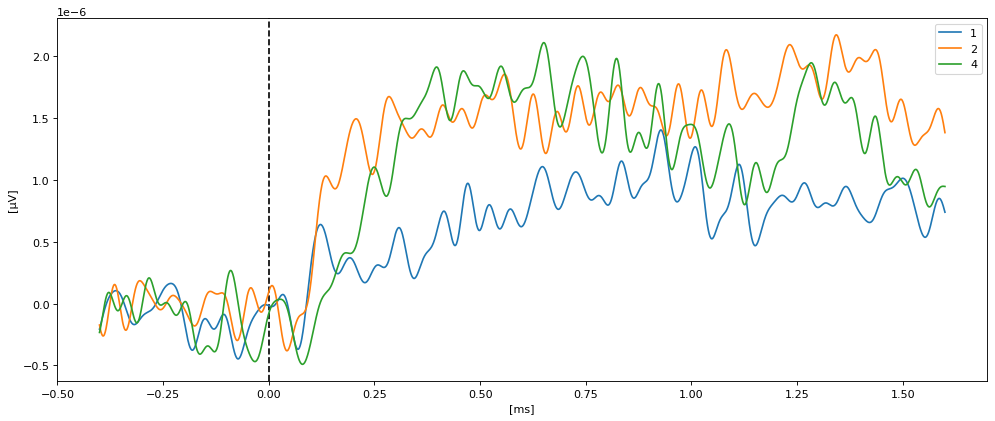

In [9]:
cda_all = dict()

for cond in cda_dict[list(cda_dict.keys())[0]].keys():
    cda_all[cond] = dict()

    for f in cda_dict.keys():
        if f == 'ER290419.bdf' and cond == '1':
            continue
        
        perf = 'good'
        ldict = cda_dict[f][cond]['left']
        rdict = cda_dict[f][cond]['right']
        if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):            
            cda_dict_cur = (cda_dict[f][cond]['left'][perf] + cda_dict[f][cond]['right'][perf])/2            
            cda_all[cond] = np.vstack([cda_all[cond], cda_dict_cur]) if len(cda_all[cond]) else cda_dict_cur
        else:
            print("==== SKIPPED: 0 points! (File: {} - Trigger: {})".format(str(f), str(t)))
        
plt.figure(figsize=(15, 6), dpi=80)
plt.axvline(x=0, color='k', linestyle='--')
plt.plot(times, cda_all['1'].mean(0), label='1')
plt.plot(times, cda_all['2'].mean(0), label='2')
plt.plot(times, cda_all['4'].mean(0), label='4')
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[ms]')
#plt.savefig("./img/Villena-Gonzalez-2019_CDA-reprod.jpg", dpi=300)

Text(0.5, 0, '[ms]')

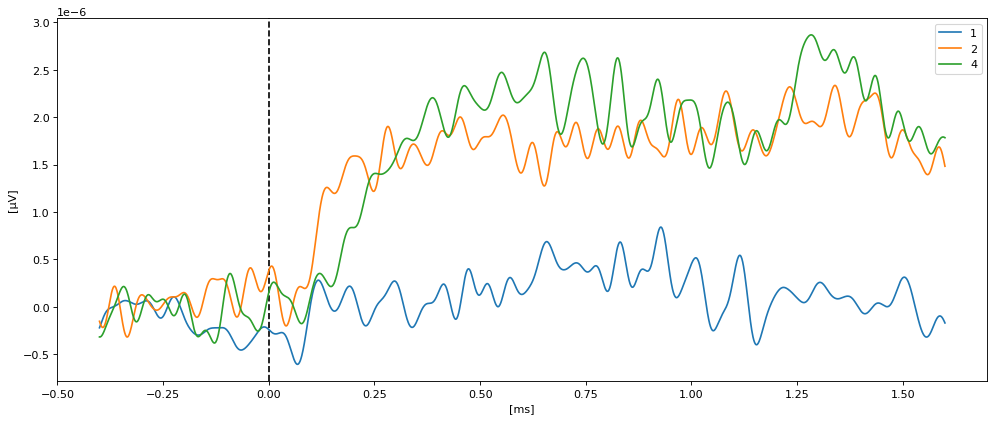

In [23]:
cda_all = dict()

for cond in cda_dict_clean[list(cda_dict.keys())[0]].keys():
    cda_all[cond] = dict()

    for f in cda_dict_clean.keys():
        #if f == 'ER290419.bdf' and cond == '1':
        #if f == 'LF210119.bdf':
        #    continue
        
        perf = 'good'
        ldict = cda_dict_clean[f][cond]['left']
        rdict = cda_dict_clean[f][cond]['right']
        if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):            
            cda_dict_cur = (cda_dict_clean[f][cond]['left'][perf] + cda_dict_clean[f][cond]['right'][perf])/2            
            cda_all[cond] = np.vstack([cda_all[cond], cda_dict_cur]) if len(cda_all[cond]) else cda_dict_cur
        else:
            print("==== SKIPPED: 0 points! (File: {} - Trigger: {})".format(str(f), str(t)))
        
plt.figure(figsize=(15, 6), dpi=80)
plt.axvline(x=0, color='k', linestyle='--')
plt.plot(times, cda_all['1'].mean(0), label='1')
plt.plot(times, cda_all['2'].mean(0), label='2')
plt.plot(times, cda_all['4'].mean(0), label='4')
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[ms]')
#plt.savefig("./img/Villena-Gonzalez-2019_CDA-reprod.jpg", dpi=300)

# Exploration

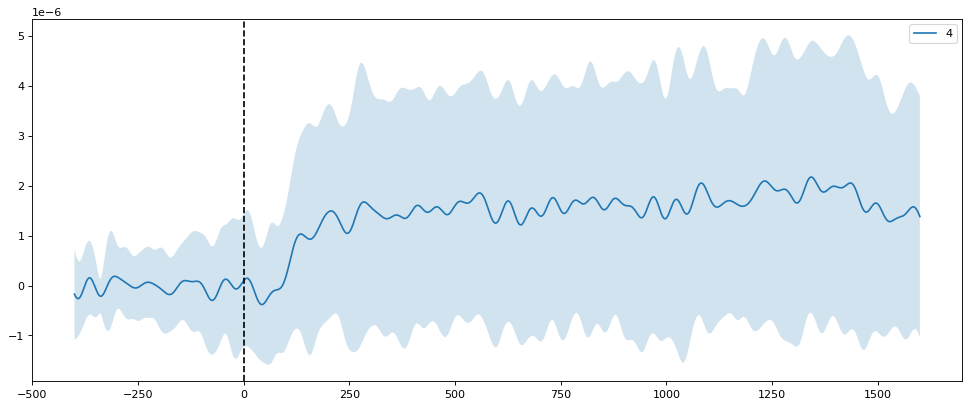

In [11]:
plt.figure(figsize=(15, 6), dpi=80)
means = cda_all['2'].mean(0)
stds = cda_all['2'].std(0)
plt.plot((times * 1000), means, label='4')
plt.fill_between((times * 1000), means-stds,means+stds,alpha=.2)

plt.axvline(x=0, color='k', linestyle='--')
#plt.gca().invert_yaxis()
plt.legend()
plt.show()

# CDA Raw vs Clean per Subject

In [ ]:
cda_all = dict()

for cond in cda_dict_clean[list(cda_dict.keys())[0]].keys():
    cda_all[cond] = dict()

    for f in cda_dict_clean.keys():
        #if f == 'ER290419.bdf' and cond == '1':
        #    continue
        
        perf = 'good'
        ldict = cda_dict_clean[f][cond]['left']
        rdict = cda_dict_clean[f][cond]['right']
        if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):            
            cda_dict_cur = (cda_dict_clean[f][cond]['left'][perf] + cda_dict_clean[f][cond]['right'][perf])/2            
            cda_all[cond] = np.vstack([cda_all[cond], cda_dict_cur]) if len(cda_all[cond]) else cda_dict_cur
        else:
            print("==== SKIPPED: 0 points! (File: {} - Trigger: {})".format(str(f), str(t)))
        
plt.figure(figsize=(15, 6), dpi=80)
plt.axvline(x=0, color='k', linestyle='--')
plt.plot(times, cda_all['1'].mean(0), label='1')
plt.plot(times, cda_all['2'].mean(0), label='2')
plt.plot(times, cda_all['4'].mean(0), label='4')
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[ms]')
#plt.savefig("./img/Villena-Gonzalez-2019_CDA-reprod.jpg", dpi=300)

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_75670/2626503829.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 3, figsize=(15,15))


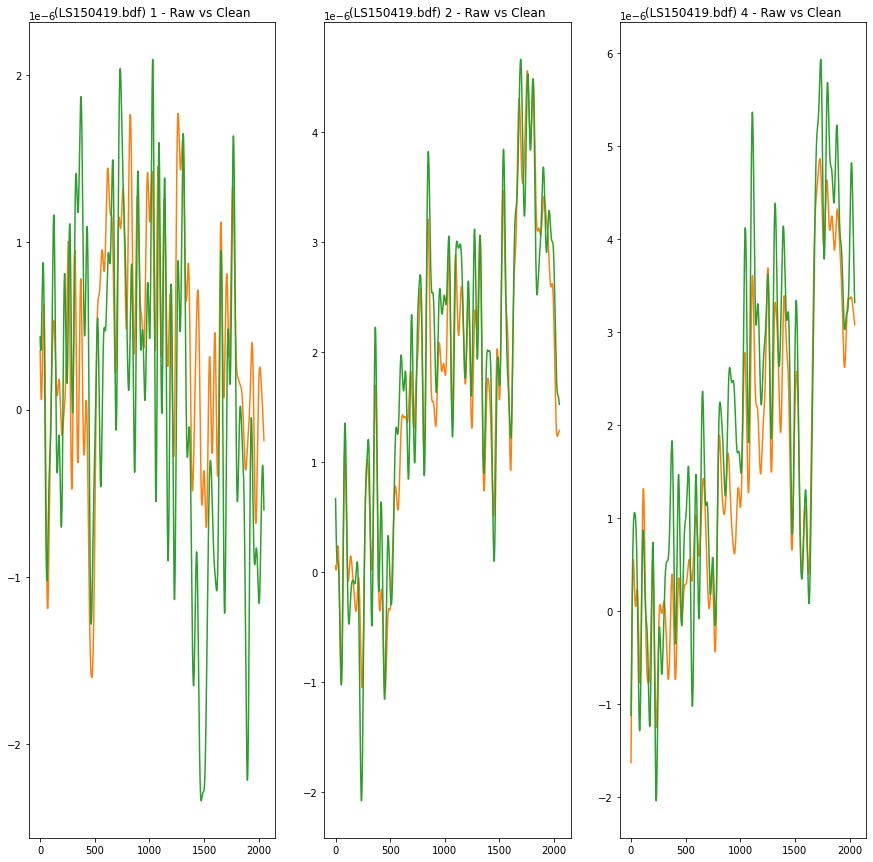

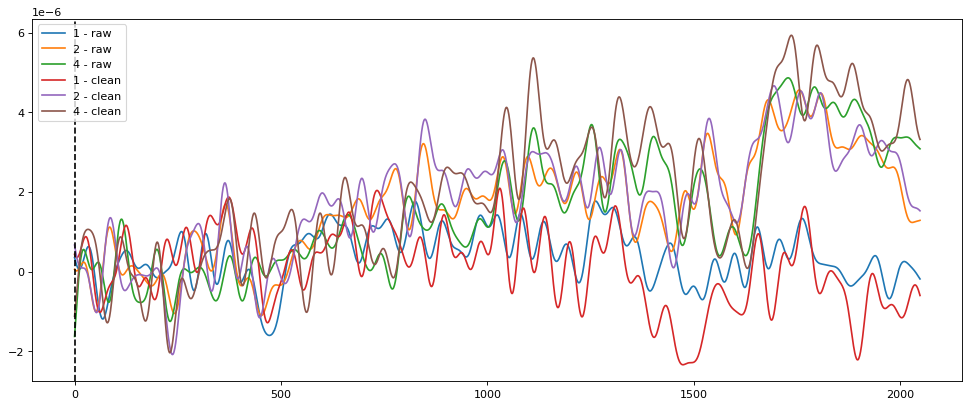

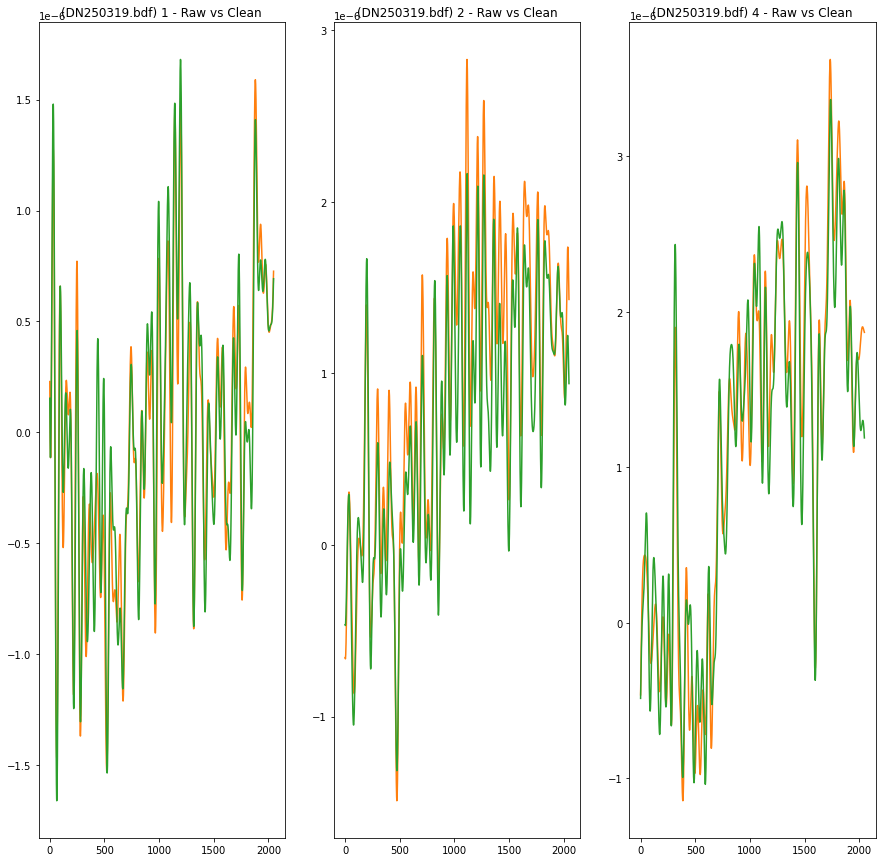

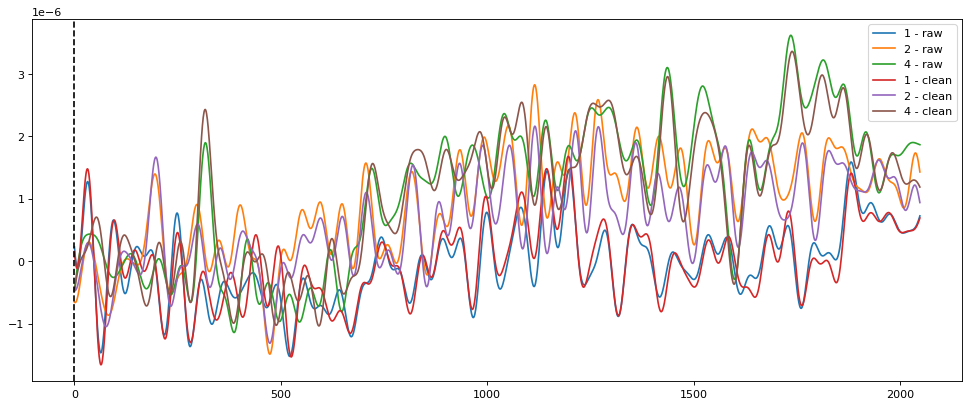

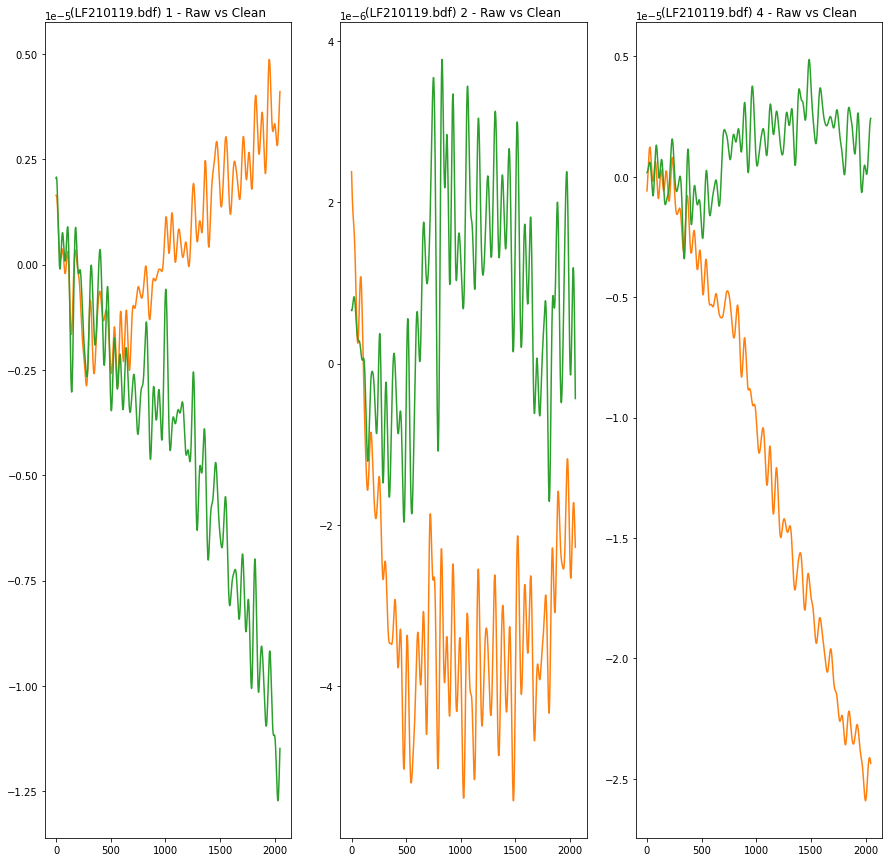

...

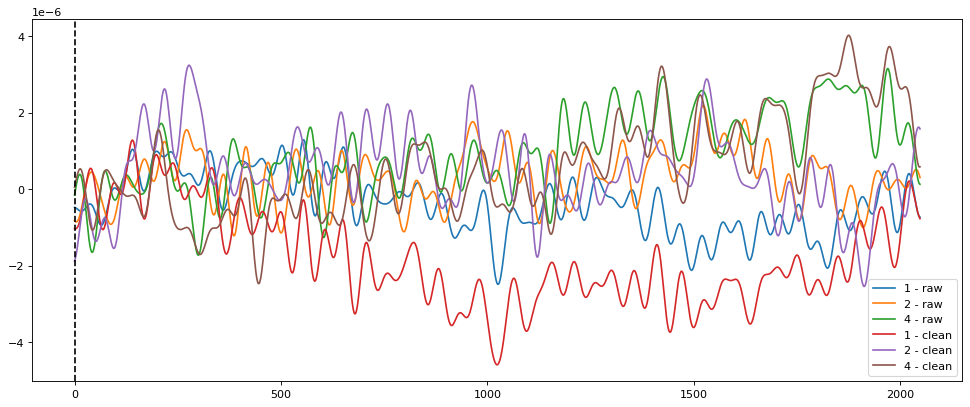

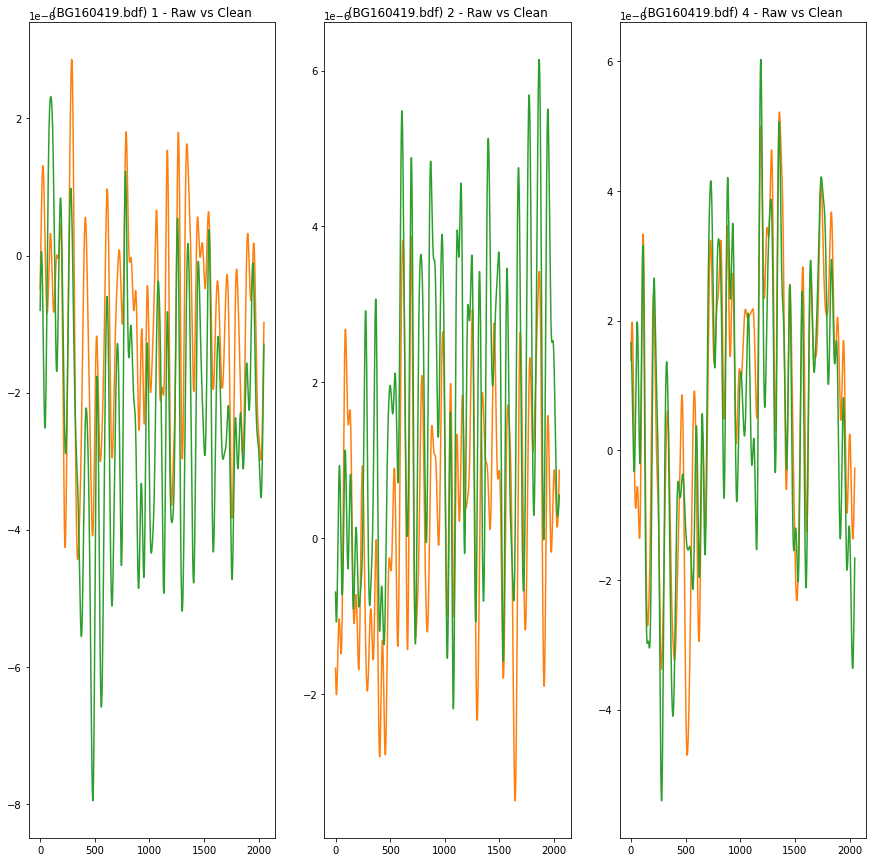

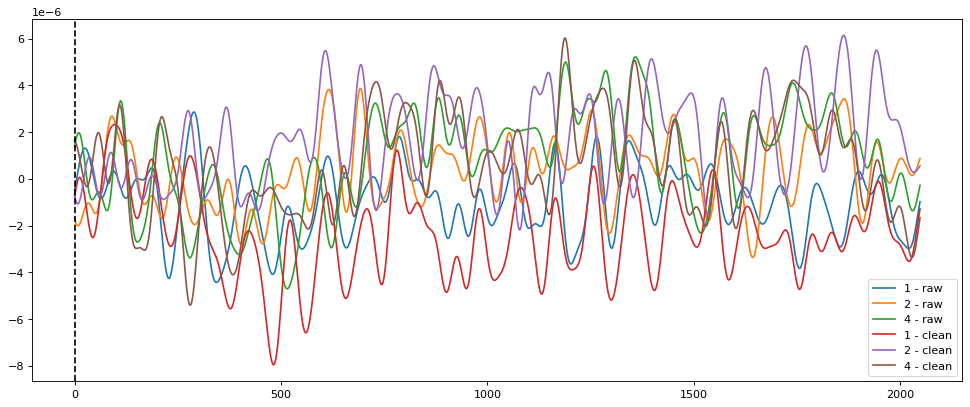

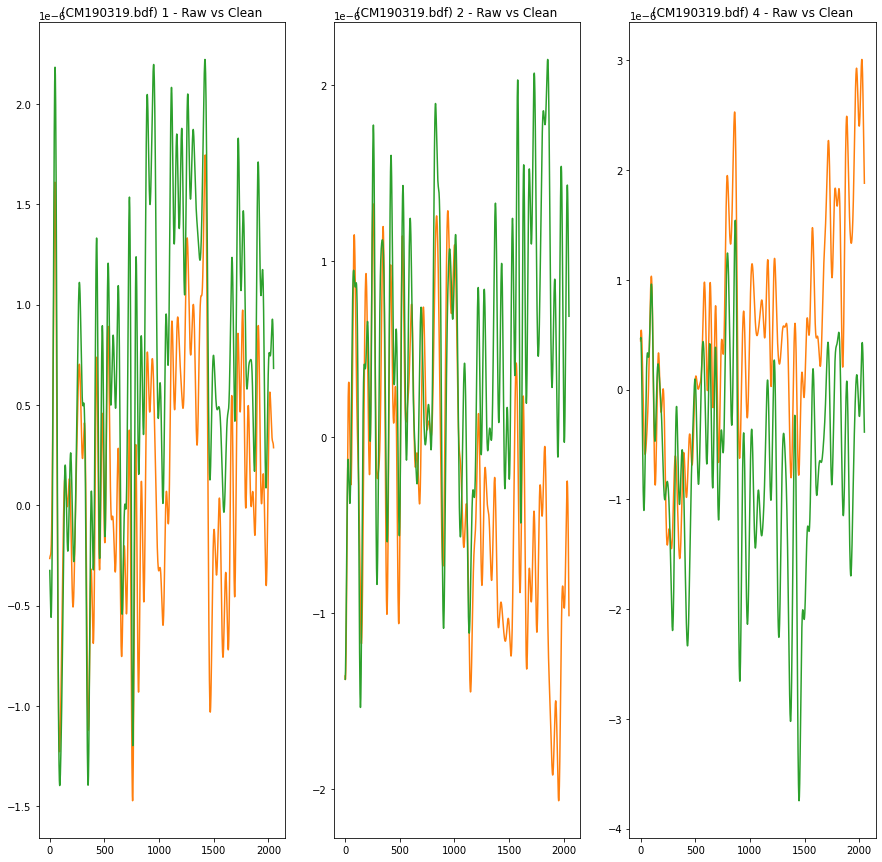

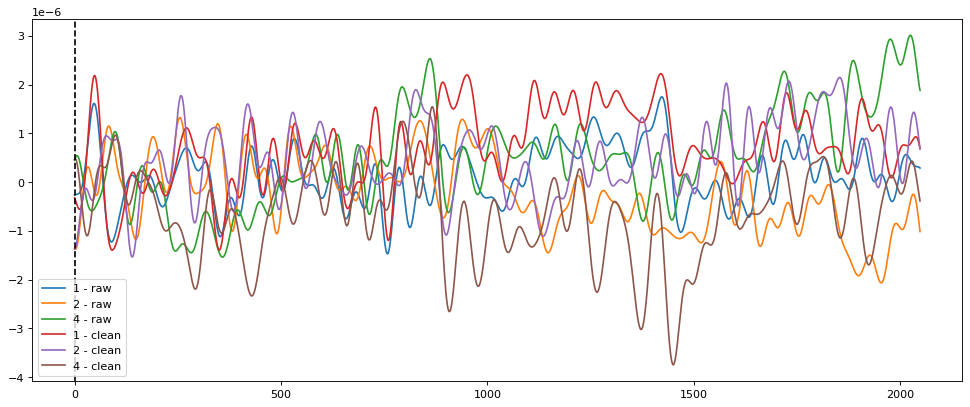

In [25]:
cda1_raw = []
cda1_clean = []
cda2_raw = []
cda2_clean = []
cda4_raw = []
cda4_clean = []
# perf = 'good'
for f in cda_dict_clean.keys():
    fig, axs = plt.subplots(1, 3, figsize=(15,15))
    for i, c in enumerate(conds):
        # Raw
        ldict = cda_dict[f][c]['left']
        rdict = cda_dict[f][c]['right']
        if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):            
            cda_dict_cur = (cda_dict[f][c]['left'][perf] + cda_dict[f][c]['right'][perf])/2
        else:
            cda_dict_cur = 0
        
        axs[i].plot(cda_dict_cur, 'tab:orange')
        
        if c == '1':
            cda1_raw = cda_dict_cur
        elif c == '2':
            cda2_raw = cda_dict_cur
        elif c == '4':
            cda4_raw = cda_dict_cur
        
        # Clean
        ldict = cda_dict_clean[f][c]['left']
        rdict = cda_dict_clean[f][c]['right']
        if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):            
            cda_dict_cur = (cda_dict_clean[f][c]['left'][perf] + cda_dict_clean[f][c]['right'][perf])/2
        else:
            cda_dict_cur = 0
            
        axs[i].plot(cda_dict_cur, 'tab:green')
        axs[i].set_title('({}) {} - Raw vs Clean'.format(f, c))
    
        if c == '1':
            cda1_clean = cda_dict_cur
        elif c == '2':
            cda2_clean = cda_dict_cur
        elif c == '4':
            cda4_clean = cda_dict_cur
            
    plt.figure(figsize=(15, 6), dpi=80)
    plt.plot(cda1_raw, label='1 - raw')
    plt.plot(cda2_raw, label='2 - raw')
    plt.plot(cda4_raw, label='4 - raw')
    plt.plot(cda1_clean, label='1 - clean')
    plt.plot(cda2_clean, label='2 - clean')
    plt.plot(cda4_clean, label='4 - clean')
    plt.axvline(x=0, color='k', linestyle='--')
    plt.legend()
    